In [1]:
import blinkED as bk
import settings
import plotly.graph_objects as go
import numpy as np
import pandas as pd


# Read Data

In [2]:
#current_filename = "Sanj_10ms_WB_trail1.xlsx"
#dir = ['Chandrika_Yadav', 'ST']
#file_path = f"{settings.PATH_TO_DATA}/21-06-22/{dir[1]}/{current_filename}"
#df_eog = bk.eog_read(file_path)
df = pd.read_excel(r"C:\Users\cheta\Downloads\Siri_10ms_WOB_trial1.xlsx")
use_data = df['CH1']
#use_data = list(use_data[6000:30000])
#use_data = df_eog["CH1"]
#use_data = list(use_data[6000:30000])

# Applying Cleaning Techniques

In [3]:
#Neurokit Method
df = {"Raw": use_data}
df["neurokit"] = bk.eog_clean(use_data, sampling_rate=100, method='neurokit')
df = pd.DataFrame(df, index=np.arange(len(use_data))/100)
# Create figure
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df["Raw"], name='Raw'))
fig.add_trace(go.Scatter(x=df.index, y=df["neurokit"], name='NeuroKit'))
fig.update_xaxes(rangeslider_visible=True)


In [4]:
#Kong1998 Method
df["kong1998"] = bk.eog_clean(use_data, sampling_rate=100, method='kong1998')
df = pd.DataFrame(df, index=np.arange(len(use_data))/100)
# Create figure
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df["Raw"], name='Raw'))
fig.add_trace(go.Scatter(x=df.index, y=df["kong1998"], name='Kong1998'))
fig.update_xaxes(rangeslider_visible=True)


In [5]:
df["agarwal2019"] = bk.eog_clean(use_data, sampling_rate=100, method='agarwal2019')
df = pd.DataFrame(df, index=np.arange(len(use_data))/100)
# Create figure
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df["Raw"], name='Raw'))
fig.add_trace(go.Scatter(x=df.index, y=df["agarwal2019"], name='Agarwal2019'))
fig.update_xaxes(rangeslider_visible=True)


In [6]:
#mne Method
df["mne"] = bk.eog_clean(use_data, sampling_rate=100, method='mne')
df = pd.DataFrame(df, index=np.arange(len(use_data))/100)
# Create figure
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df["Raw"], name='Raw'))
fig.add_trace(go.Scatter(x=df.index, y=df["mne"], name='mne'))
fig.update_xaxes(rangeslider_visible=True)

In [7]:
#brainstorm method
df["brainstorm"] = bk.eog_clean(use_data, sampling_rate=100, method='brainstorm')
df = pd.DataFrame(df, index=np.arange(len(use_data))/100)
# Create figure
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df["Raw"], name='Raw'))
fig.add_trace(go.Scatter(x=df.index, y=df["brainstorm"], name='Brainstorm'))
fig.update_xaxes(rangeslider_visible=True)

In [8]:
#blinker method
df["blinker"] = bk.eog_clean(use_data, sampling_rate=100, method='blinker')
df = pd.DataFrame(df, index=np.arange(len(use_data))/100)
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df["Raw"], name='Raw'))
fig.add_trace(go.Scatter(x=df.index, y=df["blinker"], name='blinker'))
fig.update_xaxes(rangeslider_visible=True)

# Peak and Blink Segmentation 

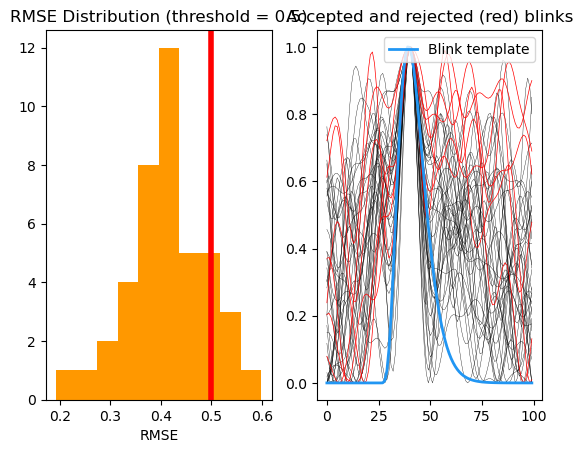

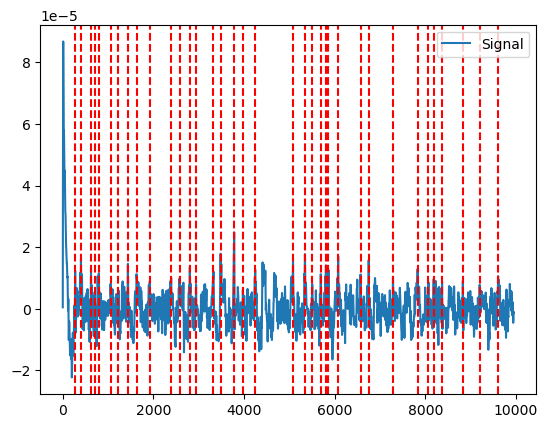

In [9]:
eog_cleaned = bk.eog_clean(use_data, sampling_rate=100, method='neurokit')
neurokit = bk.eog_findpeaks(eog_cleaned,
                                  sampling_rate=100,
                                  method="neurokit",
                                  threshold=0.5,
                                  show=True)
bk.events_plot(neurokit, eog_cleaned)


In [10]:
import ipywidgets as widgets
from IPython.display import display
import plotly.graph_objs as go

import scipy.signal as signal
cutoff=0.05
b, a = signal.butter(2, cutoff, btype='lowpass') #low pass filter
filtered_data= signal.filtfilt(b, a, use_data)
eog_cleaned = bk.eog_clean(filtered_data, sampling_rate=100, method='neurokit')

blinks = bk.signal_findpeaks(eog_cleaned, relative_height_min=0.5)
print(f"{len(blinks['Peaks'])} Blinks found")
df_blinks = pd.DataFrame(blinks)
df_blinks.head()

# Plot segmented blinks
fig = go.Figure()
fig.add_trace(go.Scatter(x=np.arange(len(eog_cleaned)), y=eog_cleaned, name='EOG signal'))

for i, peak in enumerate(blinks['Peaks']):
    start = peak    # Subtract 50 samples from start to show some lead-up to blink
    end = peak  # Add 50 samples to end to show some post-blink activity
    
    blink_segment = eog_cleaned[start:end]
    blink_times = np.arange(start, end)
    
    fig.add_trace(go.Scatter(x=blink_times, y=blink_segment, name='Blink' ))
    fig.add_trace(go.Scatter(x=[peak], y=[eog_cleaned[peak]], mode='markers', name='Blink peak' ))

fig.update_layout(xaxis_title='Sample', yaxis_title='EOG amplitude', title='Segmented Peaks')
fig.update_xaxes(rangeslider_visible=True)
fig.show()
#distribution plot of peak values

36 Blinks found


In [11]:
import ipywidgets as widgets
from IPython.display import display
import plotly.graph_objs as go

# Clean EOG data
eog_cleaned = bk.eog_clean(filtered_data, sampling_rate=100, method='neurokit')

# Find blinks
blinks = bk.signal_findpeaks(eog_cleaned, relative_height_min=0.5)
print(f"{len(blinks['Peaks'])} Blinks found")
df_blinks = pd.DataFrame(blinks)
df_blinks.head()

# Plot segmented blinks
fig = go.Figure()
fig.add_trace(go.Scatter(x=np.arange(len(eog_cleaned)), y=eog_cleaned, name='EOG signal'))

# Iterate through blinks and plot them
for i, peak in enumerate(blinks['Peaks']):
    start = peak
    end = peak
    
    # Find start and end of blink
    while start > 0 and eog_cleaned[start-1] < eog_cleaned[start]:
        start -= 1
    while end < len(eog_cleaned)-1 and eog_cleaned[end+1] < eog_cleaned[end]:
        end += 1
    
    # Determine if blink is incomplete
    peak_value = eog_cleaned[peak]
    if peak_value < 10 * (eog_cleaned[start] + eog_cleaned[end]):
        color = 'red'  # Incomplete blink
    else:
        color = 'red'  # Complete blink
    
    # Plot blink segment and blink peak
    blink_segment = eog_cleaned[start:end]
    blink_times = np.arange(start, end)
    fig.add_trace(go.Scatter(x=blink_times, y=blink_segment, name='Blink', line=dict(color=color)))
    fig.add_trace(go.Scatter(x=[peak], y=[peak_value], mode='markers', name='Blink peak', marker=dict(color=color)))

fig.update_layout(xaxis_title='Sample', yaxis_title='EOG amplitude', title='Segmented blinks')
fig.update_xaxes(rangeslider_visible=True)
fig.show()


36 Blinks found


# Histogram Plots

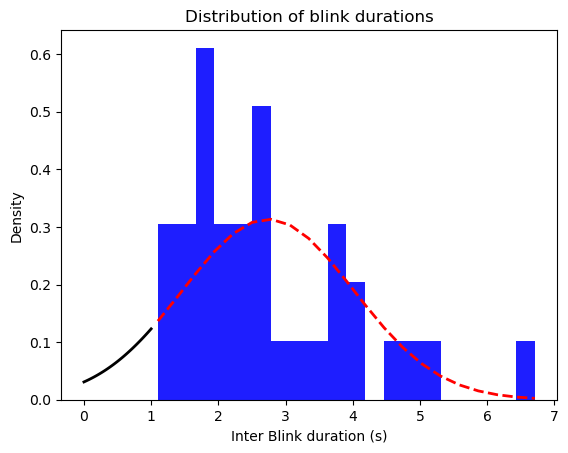

In [12]:
import numpy as np
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

# Calculate blink durations
blink_durations = np.diff(blinks['Peaks']) / 100  # Divide by sampling rate to convert to seconds

# Sort blink durations
sorted_durations = np.sort(blink_durations)

# Fit Gaussian distribution
mu, std = stats.norm.fit(sorted_durations)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = stats.norm.pdf(x, mu, std)

# Plot histogram and Gaussian distribution
plt.hist(sorted_durations, bins=20, density=True, alpha=0.6, color='b')
plt.plot(x, p, 'k', linewidth=2)
plt.xlabel('Inter Blink duration (s)')
plt.ylabel('Density')
plt.title('Distribution of blink durations')

# Trace Gaussian fit over histogram
density, bins, _ = plt.hist(sorted_durations, bins=20, density=True, alpha=0.7, color='b')
y = stats.norm.pdf(bins, mu, std)
plt.plot(bins, y, 'r--', linewidth=2)

plt.show()



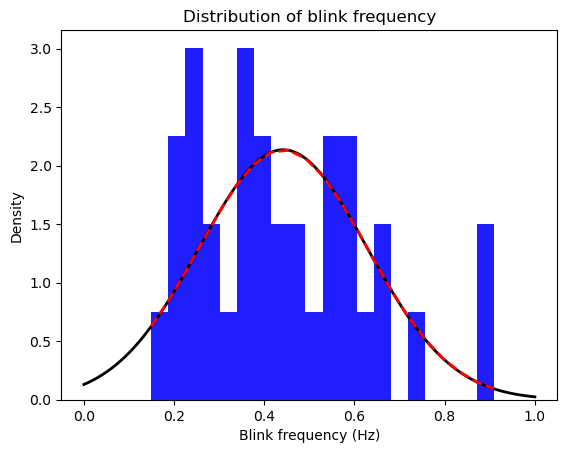

In [13]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

# Calculate blink durations
blink_durations = np.diff(blinks['Peaks']) / 100  # Divide by sampling rate to convert to seconds

# Calculate blink frequency
blink_frequency = 1 / blink_durations

# Sort blink frequency
sorted_frequency = np.sort(blink_frequency)

# Fit Gaussian distribution
mu, std = stats.norm.fit(sorted_frequency)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = stats.norm.pdf(x, mu, std)

# Plot histogram and Gaussian distribution
plt.hist(sorted_frequency, bins=20, density=True, alpha=0.6, color='b')
plt.plot(x, p, 'k', linewidth=2)
plt.xlabel('Blink frequency (Hz)')
plt.ylabel('Density')
plt.title('Distribution of blink frequency')

# Trace Gaussian fit over histogram
density, bins, _ = plt.hist(sorted_frequency, bins=20, density=True, alpha=0.7, color='b')
y = stats.norm.pdf(bins, mu, std)
plt.plot(bins, y, 'r--', linewidth=2)

plt.show()



# Feature Extraction

In [27]:
import blinkED as bk
import settings
import plotly.graph_objects as go
import numpy as np
import pandas as pd
df = pd.read_excel(r"C:\Users\cheta\Downloads\CH_10ms_WB_trial2.xlsx")
use_data = df['CH2']
b, a = signal.butter(2, cutoff, btype='lowpass') #low pass filter
filtered_data= signal.filtfilt(b, a, use_data)
eog_cleaned = bk.eog_clean(filtered_data, sampling_rate=100, method='neurokit')
#use_data = list(use_data[6000:30000])
# Extract the data from channel1
#channel1_data = df['CH2']
#eog_cleaned = bk.eog_clean(use_data, sampling_rate=250, method = 'neurokit')
peaks = bk.eog_findpeaks(eog_cleaned, sampling_rate=250)
print(len(peaks))
info = bk.eog_features(eog_cleaned, peaks, sampling_rate=250)
# Create a pandas DataFrame with the features
df = pd.DataFrame(info)

# Display the DataFrame
#print(df)
#writer = pd.ExcelWriter('Chndrika_data.xlsx', engine='xlsxwriter')

# Write the blink data to Sheet 1
#df.to_excel(writer, sheet_name='Sheet1', index=False)

# Save and close the workbook
#writer.save()

27


In [28]:
import blink_params
eog_cleaned = bk.eog_clean(use_data, sampling_rate=100, method='neurokit')
peaks = bk.eog_findpeaks(eog_cleaned, sampling_rate=100)
blinks = bk.signal_findpeaks(eog_cleaned, relative_height_min=0.5)
df_blinks = pd.DataFrame(blinks)
df_blinks.head()
df_blinks = df_blinks.dropna(subset=["Onsets", "Offsets"])
blink_params.blink_stats.perform(eog_cleaned, df_blinks)
df_blinks.head()
combined_df = pd.concat([df, df_blinks])
writer = pd.ExcelWriter("CH_10ms_WB_trial2_ch2_data.xlsx", engine='xlsxwriter')

# Write the blink data to Sheet 1
combined_df.to_excel(writer, sheet_name='Sheet1', index=False)

# Save and close the workbook
writer.save()

# Clustering

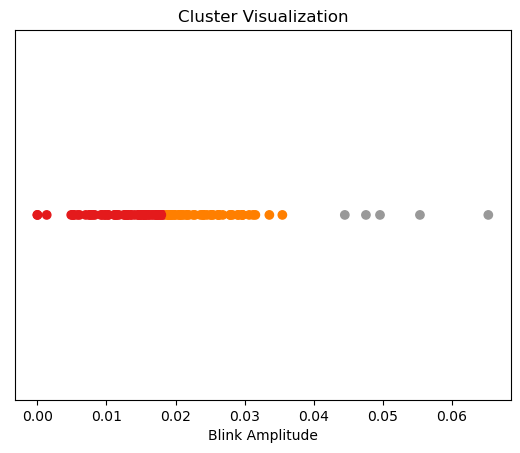

In [9]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score

# Read the data from Excel
excel_file = 'Cluster_data.xlsx'
data_df = pd.read_excel('Cluster_data.xlsx')

# Assuming the blink amplitude data is in the first column
blink_amplitudes = data_df.iloc[:, 0].values

# Convert data to numpy array
data = blink_amplitudes.reshape(-1, 1)

# Initialize and fit the K-means model
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(data)

# Get the cluster labels
cluster_labels = kmeans.labels_

# Visualize clusters
colors = ['red', 'blue', 'green']
plt.scatter(blink_amplitudes, np.zeros_like(blink_amplitudes), c=cluster_labels, cmap=plt.cm.get_cmap('Set1', 3))
plt.xlabel('Blink Amplitude')
plt.yticks([])
plt.title('Cluster Visualization')
plt.show()